# Advanced Lane Finding Project - Pipeline Development

In this notebook, I establish the algorithms needed and parameters to perform the following steps:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

In [1]:
from pathlib import Path
import os.path as osp
import glob

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## 1. Compute the camera calibration matrix and distortion coefficients

Unable to find corners in camera_cal/calibration1.jpg
Unable to find corners in camera_cal/calibration4.jpg
Unable to find corners in camera_cal/calibration5.jpg


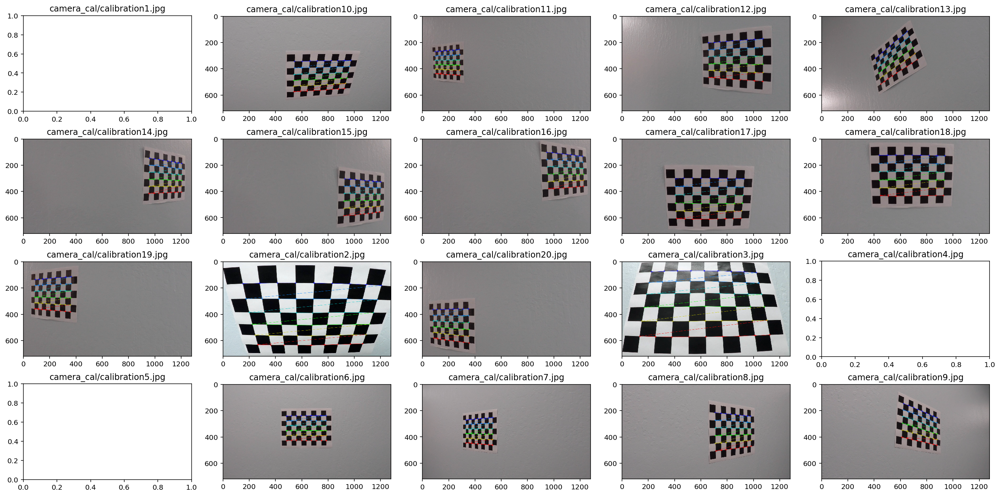

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

nx = 9
ny = 6

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

f, axes = plt.subplots(4, 5, figsize=(20, 10));
ax = axes.flatten()
# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny))

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        _ = ax[i].imshow(img);
    else:
        print("Unable to find corners in %s" % fname)
    _ = ax[i].set_title(fname);

f.tight_layout()

## 2. Apply a distortion correction to raw images.

In [3]:
import pickle

# Test undistortion on an image 
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

# save camera calibration and transform matrix for  later user
pickle.dump((mtx, dist), open('camera_cal.pkl', 'wb'))

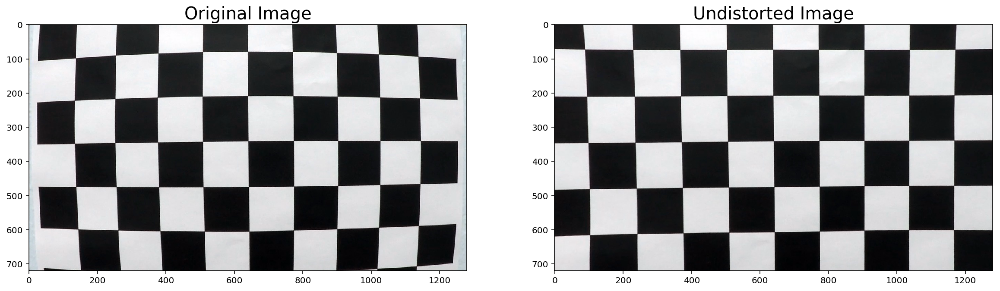

In [4]:
dst = cv2.undistort(img, mtx, dist, None, mtx)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10));
ax1.imshow(img);
ax1.set_title('Original Image', fontsize=20);
ax2.imshow(dst);
ax2.set_title('Undistorted Image', fontsize=20);

plt.savefig('output_images/undistorted_chessboard.png');

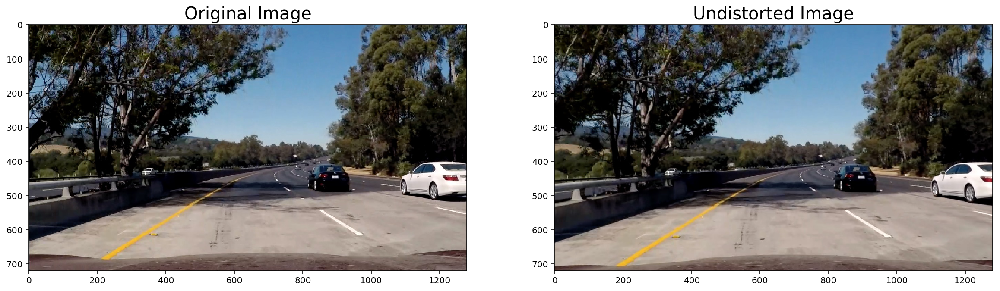

In [8]:
# Test on on-board car image 
img = cv2.imread('test_images/test5.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

dst = cv2.undistort(img, mtx, dist, None, mtx)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10));
ax1.imshow(img);
ax1.set_title('Original Image', fontsize=20);
ax2.imshow(dst);
ax2.set_title('Undistorted Image', fontsize=20);

plt.savefig('output_images/undistorted_test_img.png');

## 3. Use color transforms, gradients, etc., to create a thresholded binary image.

In [9]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0)
    elif orient == 'y':
        sobel = cv2.Sobel(l_channel, cv2.CV_64F, 0, 1)
        
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
    return grad_binary

def mag_thresh(l_channel, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(l_channel, cv2.CV_64F, 0, 1)
    
    # 3) Calculate the magnitude 
    abs_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # 5) Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
    return mag_binary

def dir_threshold(l_channel, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(l_channel, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)

    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    
    # 5) Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(grad_dir)
    dir_binary[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1

    # 6) Return this mask as your binary_output image
    return dir_binary

def color_threshold(s_channel, thresh=(0, 255)):  
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= thresh[0]) & (s_channel <= thresh[1])] = 1
    
    return s_binary

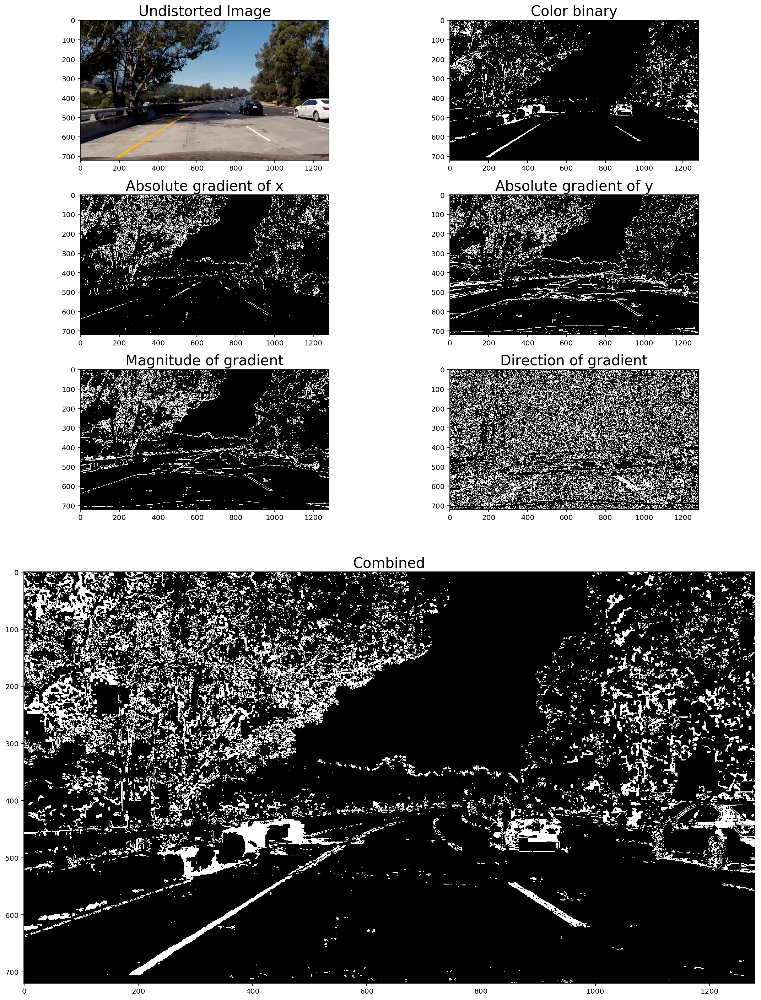

In [12]:
import matplotlib.gridspec as gridspec

# Test on on-board car image 
image = cv2.imread('test_images/test5.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.undistort(image, mtx, dist, None, mtx)

hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
l_channel = hls[:, :, 1]
s_channel = hls[:, :, 2]

# Choose a Sobel kernel size
ksize = 15 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(l_channel, orient='x', sobel_kernel=ksize, thresh=(20, 100))
grady = abs_sobel_thresh(l_channel, orient='y', sobel_kernel=ksize, thresh=(20, 100))
mag_binary = mag_thresh(l_channel, sobel_kernel=ksize, mag_thresh=(30, 100))
dir_binary = dir_threshold(l_channel, sobel_kernel=ksize, thresh=(0.7, 1.3))
col_binary = color_threshold(s_channel, thresh=(170, 255))

combined_grad = np.zeros_like(dir_binary)
combined_grad[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
combined = np.zeros_like(combined_grad)
combined[((combined_grad == 1) | (col_binary == 1))] = 1

gs = gridspec.GridSpec(4, 2, height_ratios=[3, 3, 3, 10])
ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[0, 1])
ax2 = plt.subplot(gs[1, 0])
ax3 = plt.subplot(gs[1, 1])
ax4 = plt.subplot(gs[2, 0])
ax5 = plt.subplot(gs[2, 1])
ax6 = plt.subplot(gs[3, :])

# Visualize binary outputs
ax0.imshow(image);
ax0.set_title('Undistorted Image', fontsize=20);
ax1.imshow(col_binary, cmap='gray');
ax1.set_title('Color binary', fontsize=20);
ax2.imshow(gradx, cmap='gray');
ax2.set_title('Absolute gradient of x', fontsize=20);
ax3.imshow(grady, cmap='gray');
ax3.set_title('Absolute gradient of y', fontsize=20);
ax4.imshow(mag_binary, cmap='gray');
ax4.set_title('Magnitude of gradient', fontsize=20);
ax5.imshow(dir_binary, cmap='gray');
ax5.set_title('Direction of gradient', fontsize=20);
ax6.imshow(combined, cmap='gray');
ax6.set_title('Combined', fontsize=20);

fig = plt.gcf()
fig.set_size_inches(15, 20)
fig.tight_layout();
fig.savefig('output_images/binary_test_img.png');

## 4. Apply a perspective transform to rectify binary image ("birds-eye view")

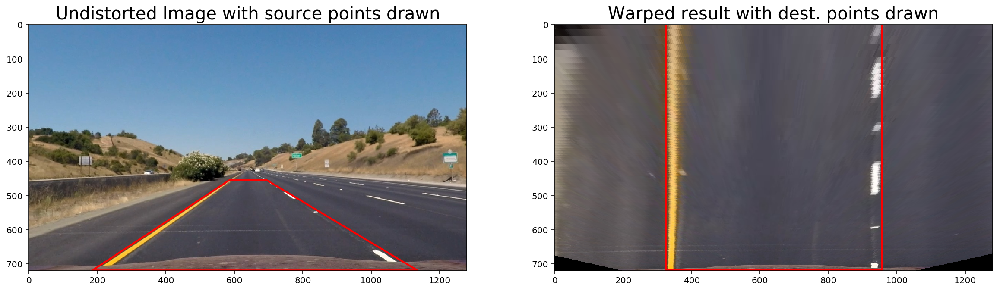

In [19]:
def warper(img, src, dst):
    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image

    return warped

def unwarper(img, src, dst):
    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    Minv = cv2.getPerspectiveTransform(dst, src)
    dewarped = cv2.warpPerspective(img, Minv, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image

    return dewarped

image = cv2.imread('test_images/straight_lines1.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.undistort(image, mtx, dist, None, mtx)

imshape = image.shape
src_points = np.float32([
    (0 + 185, imshape[0]),
    (imshape[1]/2 - 55, 455),
    (imshape[1]/2 + 55, 455),
    (imshape[1] - 145, imshape[0])
])

dest_points = np.float32([
    (0 + 325, imshape[0]),
    (0 + 325, 0),
    (imshape[1] - 325, 0),
    (imshape[1] - 325, imshape[0])])

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10));
ax1.imshow(image);
x = [src_points[0,0], src_points[1,0], src_points[2,0], src_points[3,0], src_points[0,0]]
y = [src_points[0,1]-1, src_points[1,1], src_points[2,1], src_points[3,1]-1, src_points[0,1]-1]
ax1.plot(x, y, 'r-', lw=2);
ax1.set_title('Undistorted Image with source points drawn', fontsize=20);
ax2.imshow(warper(image, src_points, dest_points));
x = [dest_points[0,0], dest_points[1,0], dest_points[2,0], dest_points[3,0], dest_points[0,0]]
y = [dest_points[0,1]-1, dest_points[1,1], dest_points[2,1], dest_points[3,1]-1, dest_points[0,1]-1]
ax2.plot(x, y, 'r-', lw=2);
ax2.set_title('Warped result with dest. points drawn', fontsize=20);
f.savefig('output_images/transformed_test_img.png');

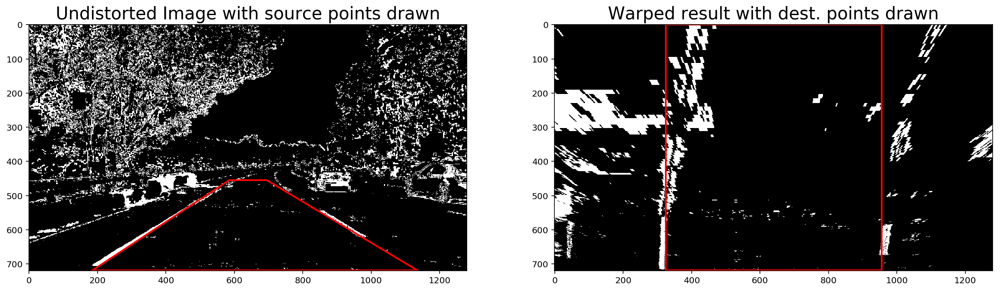

In [20]:
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10));
ax1.imshow(combined, cmap='gray');
x = [src_points[0,0], src_points[1,0], src_points[2,0], src_points[3,0], src_points[0,0]]
y = [src_points[0,1]-1, src_points[1,1], src_points[2,1], src_points[3,1]-1, src_points[0,1]-1]
ax1.plot(x, y, 'r-', lw=2);
ax1.set_title('Undistorted Image with source points drawn', fontsize=20);
ax2.imshow(warper(combined, src_points, dest_points), cmap='gray');
x = [dest_points[0,0], dest_points[1,0], dest_points[2,0], dest_points[3,0], dest_points[0,0]]
y = [dest_points[0,1]-1, dest_points[1,1], dest_points[2,1], dest_points[3,1]-1, dest_points[0,1]-1]
ax2.plot(x, y, 'r-', lw=2);
ax2.set_title('Warped result with dest. points drawn', fontsize=20);
f.savefig('output_images/transformed_binary_img.png');

## 5. Detect lane pixels and fit to find the lane boundary.

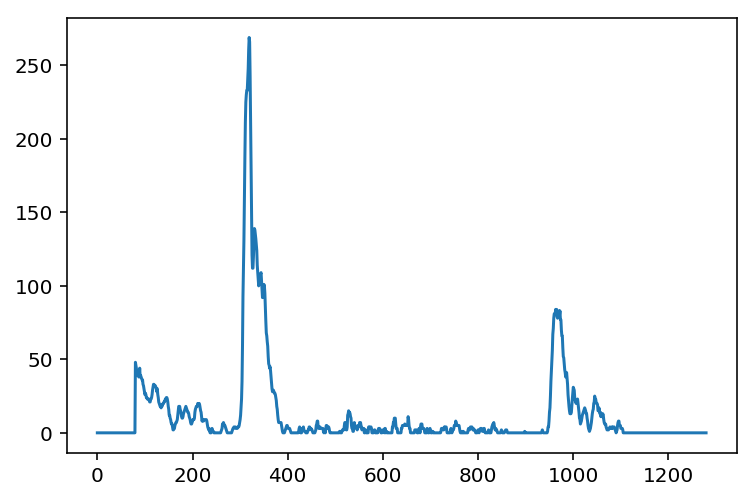

In [22]:
binary_warped = warper(combined, src_points, dest_points)

# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[int(binary_warped.shape[0] / 2 ):,:], axis=0)

# Trim noisy ends from influencing 
histogram[:80]= 0
histogram[-80:] = 0

plt.plot(histogram)

In [24]:
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 75
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

In [25]:
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height;
    win_y_high = binary_warped.shape[0] - window*window_height;
    win_xleft_low = leftx_current - margin;
    win_xleft_high = leftx_current + margin;
    win_xright_low = rightx_current - margin;
    win_xright_high = rightx_current + margin;

    # Draw the windows on the visualization image
    _ = cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2);
    _ = cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2);

    # Identify the nonzero pixels in x and y within the window
    good_left_inds = (
        (nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & \
        (nonzerox >= win_xleft_low) & \
        (nonzerox < win_xleft_high)
    ).nonzero()[0];
    good_right_inds = (
        (nonzeroy >= win_y_low) & \
        (nonzeroy < win_y_high) & \
        (nonzerox >= win_xright_low) & \
        (nonzerox < win_xright_high)
    ).nonzero()[0];

    # Append these indices to the lists
    left_lane_inds.append(good_left_inds);
    right_lane_inds.append(good_right_inds);

    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]));
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]));

In [26]:
# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

In [27]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

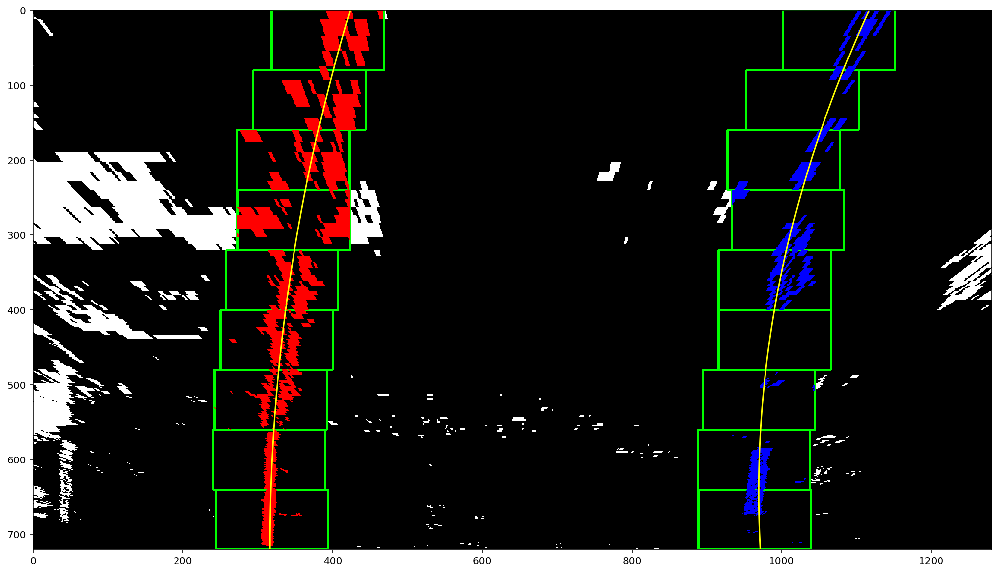

In [29]:
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
f, ax = plt.subplots(1, figsize=(20, 10));
ax.imshow(out_img / 255);
ax.plot(left_fitx, ploty, color='yellow');
ax.plot(right_fitx, ploty, color='yellow');
ax.set_xlim(0, 1280);
ax.set_ylim(720, 0);
f.savefig('output_images/lane_pixels_binary_img.png');

### Approach for finding lane pixels if for next frame when fit already available

In [30]:
# implement approach for next frame

# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 75
left_lane_inds = (
    (nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & \
    (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))
) 
right_lane_inds = (
    (nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & \
    (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin))
)  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

In [31]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))


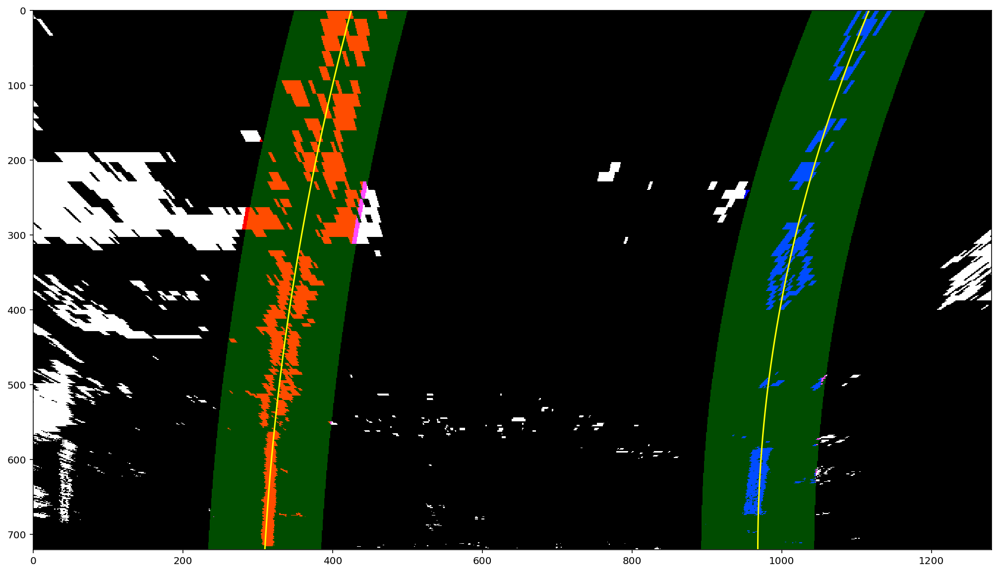

In [33]:
# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0));
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0));
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0);
f, ax = plt.subplots(1, figsize=(20, 10));
ax.imshow(result / 255);
ax.plot(left_fitx, ploty, color='yellow');
ax.plot(right_fitx, ploty, color='yellow');
ax.set_xlim(0, 1280);
ax.set_ylim(720, 0);
f.savefig('output_images/lane_pixels_2_binary_img.png');

## 6. Determine the curvature of the lane and vehicle position with respect to center.

In [34]:
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Define y-value where we want radius of curvature
y_eval = np.max(ploty)

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
avg_curverad = (left_curverad +  right_curverad) / 2
print('Left lane radius: %.2f m\nRight lane radius: %.2f m\nAvg. radius: %.2f m' % \
      (left_curverad, right_curverad, avg_curverad))

rad_str = 'Radius of Curvature = %dm' % np.round(avg_curverad)
print(rad_str)

Left lane radius: 1137.36 m
Right lane radius: 574.47 m
Avg. radius: 855.92 m
Radius of Curvature = 856m


In [35]:
y_eval = np.max(ploty)
leftx = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2]
rightx = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]
lane_center_px = (leftx + rightx) / 2

lane_center_offset_px = lane_center_px - (binary_warped.shape[1] / 2)
lane_center_offset_m = lane_center_offset_px * xm_per_pix
offset_str = 'Vehicle is %.2fm off center of lane' % lane_center_offset_m
print(offset_str)

Vehicle is -0.01m off center of lane


## 7. Warp the detected lane boundaries back onto the original image.

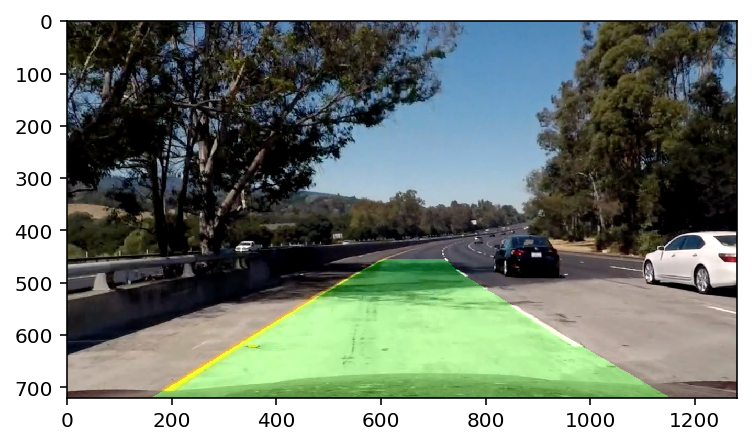

In [49]:
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

original_image = cv2.cvtColor(cv2.imread('test_images/test5.jpg'), cv2.COLOR_BGR2RGB);
undist = cv2.undistort(original_image, mtx, dist, None, mtx);

warped = binary_warped;

# Create an image to draw the lines on
warp_zero = np.zeros_like(warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0));

newwarp = unwarper(color_warp, src_points, dest_points)

# Combine the result with the original image
result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

plt.imshow(result);

## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

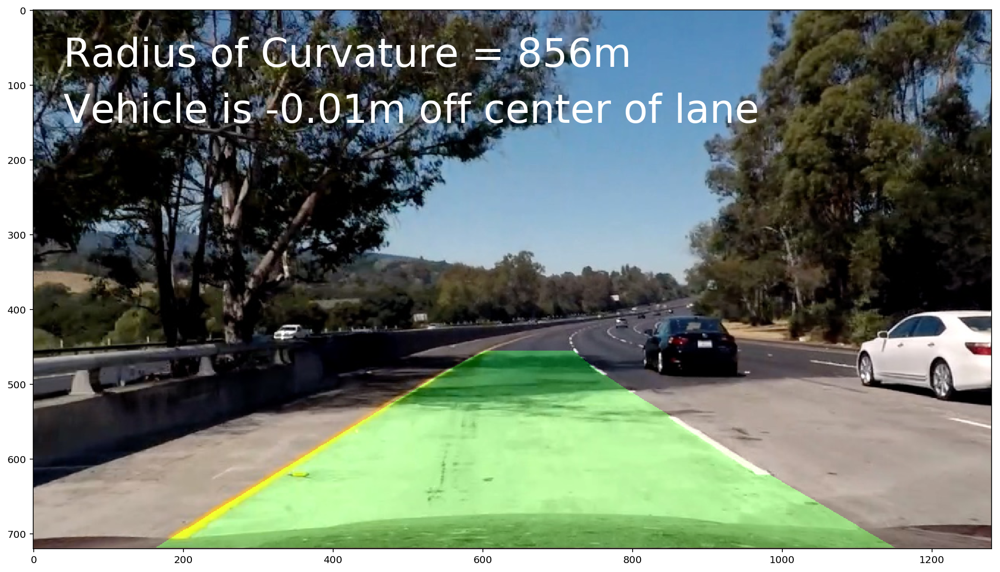

In [44]:
f, ax = plt.subplots(1, figsize=(20, 10));
ax.imshow(result);
ax.text(40, 75, rad_str, color='w', fontsize=40);
ax.text(40, 150, offset_str, color='w', fontsize=40);
f.savefig('output_images/final_output_img.png');